In [1]:
# Importing libraries
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

from plotly.subplots import make_subplots
from ipywidgets import widgets

import datetime as dt
from datetime import date

import gc

In [2]:
pio.templates.default = "plotly_dark"

In [3]:
df = pd.read_csv('all.csv')
world = pd.read_csv('world.csv')
conti = pd.read_csv('continents.csv')
countries = pd.read_csv('parameters.csv')

In [ ]:
df.date=pd.to_datetime(df.date)
world.date=pd.to_datetime(world.date)
conti.date=pd.to_datetime(conti.date)
countries.date=pd.to_datetime(countries.date)

In [4]:
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

AttributeError: Can only use .dt accessor with datetimelike values

In [38]:
def multi_plot(countries,col,title, addAll = True):
    fig = go.Figure()

    for country in countries.location.unique():
        fig.add_trace(
            go.Scatter(
                x = countries[countries['location']==country]['date'],
                y = countries[countries['location']==country][col],
                name = country
            )
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': np.isin(countries.location.unique(), countries.location.unique()),
                               'title': 'All',
                               'showlegend':False}])

    def create_layout_button(country):
        return dict(label = country,
                    method = 'update',
                    args = [{'visible': np.isin(countries.location.unique(), [country]),
                             'title': country,
                             'showlegend': False}])
    mapfunc = lambda country: create_layout_button(country)
    vfunc = np.vectorize(mapfunc)

    fig.update_layout(title=title,showlegend = False,
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll)+list(vfunc(countries.location.unique()))
            )
        ])
    
    return fig

In [ ]:
def country_plot(nations):
    
    colors=['#FF0000','#FFB503','#2369D1','#A8EB12','grey']
    color_map = {nations[i]:colors[i] for i in range(len(nations))}
    
    df2 = df[df.location.isin(nations)].set_index(['date','location']).unstack('location')['new_cases_per_million'].rolling(7).mean()
    df2.reset_index(inplace=True)

    df_melt1 = df2.melt(id_vars='date', value_vars=nations)

    df3 = df[df.location.isin(nations)].set_index(['date','location']).unstack('location')['new_deaths_per_million'].rolling(7).mean()
    df3.reset_index(inplace=True)

    df_melt2 = df3.melt(id_vars='date', value_vars=nations)   


    traces1 = px.line(df[df.location.isin(nations)], x='date', y='total_cases_per_million',
                      color='location', hover_name='location', hover_data={'location':False},
                      color_discrete_map=color_map,
                      labels={'total_cases_per_million':'Cases Per Million'})

    traces2 = px.line(df[df.location.isin(nations)], x='date', y='total_deaths_per_million', 
                      hover_name='location', hover_data={'location':False},
                      color_discrete_map=color_map,
                      color='location', labels={'total_deaths_per_million':'Deaths Per Million'})

    traces3 = px.line(df_melt1, x='date', y='value',color='location',
                      color_discrete_map=color_map,
                      hover_name='location', hover_data={'location':False},
                     labels={'value':'Daily Cases Per Million'})


    traces4 = px.line(df_melt2, x='date', y='value',color='location',
                      color_discrete_map=color_map,
                      hover_name='location', hover_data={'location':False},
                      labels={'value':'Daily Deaths Per Million'})

    traces5 = px.line(df[df.location.isin(nations)], x='date', y='cfr',
                      hover_name='location', hover_data={'location':False},
                      color_discrete_map=color_map,
                      color='location', labels={'value':'Case Fatality Rate'})

    fig = make_subplots(rows=5, cols=1,shared_yaxes=False,shared_xaxes=True,
                    subplot_titles=('Cumulative Incidence Rate (per million population)', 
                                    'Cumulative Mortality rate (per million population)', 
                                    "Daily Incidence rate (per million pouplation)", 
                                    "Daily Mortality Rate (per million population)",
                                    "Case Fatality Rate (deaths per hundred cases)"))
    for trace in traces1.data:
        fig.add_trace(trace,1,1)

    for trace in traces2.data:
        fig.add_trace(trace,2,1)

    for trace in traces3.data:
        fig.add_trace(trace,3,1)

    for trace in traces4.data:
        fig.add_trace(trace,4,1)

    for trace in traces5.data:
        fig.add_trace(trace,5,1)

    for i in range(len(nations)*4):
        fig.data[i].showlegend=False

    fig.update_layout(height=1200, width=800,
                      showlegend=True,
                      legend=dict(title='Country :'),  
                     )
    del df2, df3, df_melt1, df_melt2, traces1, traces2, traces3, traces4, traces5
    return fig


#### Rates- Countries

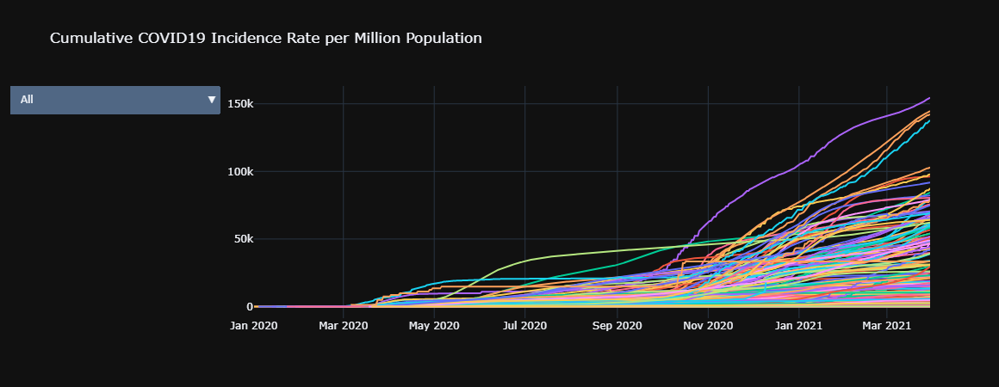

In [46]:
multi_plot(df, 'total_cases_per_million', 'Cumulative COVID19 Incidence Rate per Million Population')

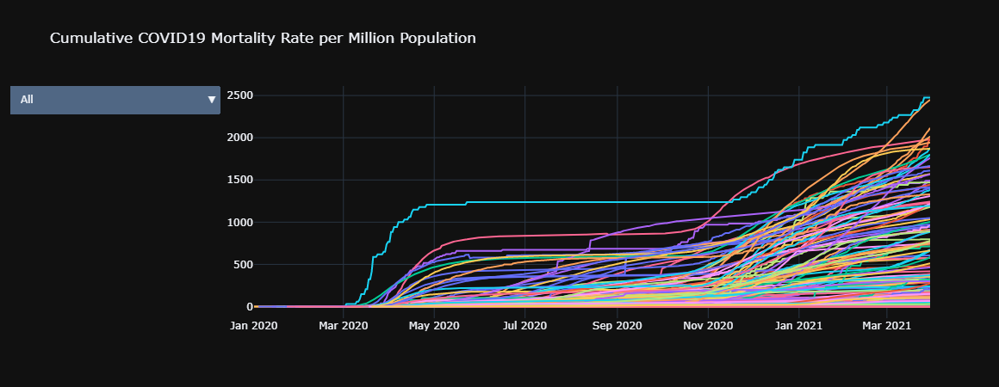

In [47]:
multi_plot(df, 'total_deaths_per_million','Cumulative COVID19 Mortality Rate per Million Population')

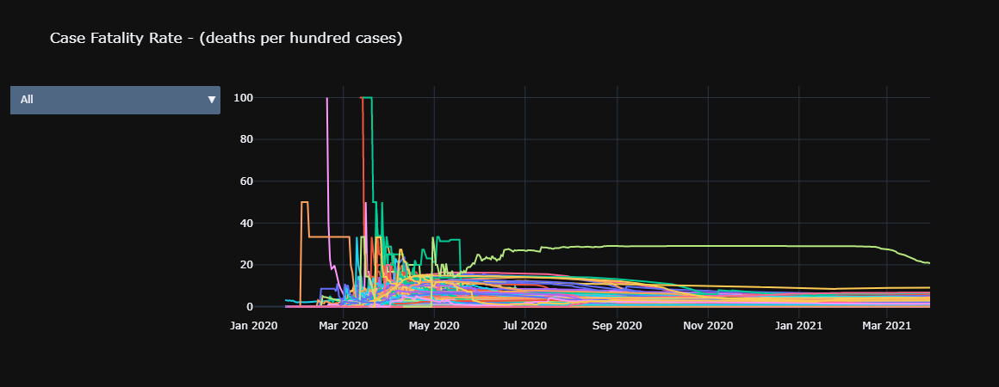

In [50]:
multi_plot(df, 'cfr', 'Case Fatality Rate - (deaths per hundred cases)')

#### Plotting percentage of cases curden across countries

In [ ]:
df1 = df.loc[(df['year']==2021)].loc[df['month']==3]
df1 = df1.groupby(by='location',as_index=False).agg({'new_cases':'sum',
                                           'new_deaths':'sum',
                                           'new_cases_per_million':'sum',
                                           'new_deaths_per_million':'sum'})
df1.columns = ['location', 'monthly_tc', 'monthly_td', 'monthly_inci',
       'monthly_mort']

In [ ]:
countries = countries.merge(df1, how='left', on='location')

del df1

In [ ]:
countries.sort_values(by='monthly_tc', inplace=True,ascending=False)

x = countries['location']
y1 = countries['monthly_tc']
y2 = countries["monthly_tc"].cumsum()/countries["monthly_tc"].sum()*100

fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Bar(x=x, y=y1, name="March Total Cases"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=x, y=y2, name="Cumulative Percentage"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Case Burden",
)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1)

# Set x-axis title
fig.update_xaxes(title_text="Countries")

# Set y-axes titles
fig.update_yaxes(title_text="Monthly Total Cases", secondary_y=False)
fig.update_yaxes(title_text="Percentage", secondary_y=True)
fig.show()

del fig

#### Comparative graphs for selected countries

In [ ]:
nations = ['India','Mexico','United States','Yemen', 'Brazil'] # Max 5
fig = country_plot(nations)
fig.show()

del fig

#### India

In [ ]:
ind = df[df.location=='India'].copy()

In [ ]:
monthly = ind[ind['year']==2020].groupby(by=['month'], as_index=False).agg({'new_cases':'sum',
                                                                                'new_deaths':'sum',
                                                                                'new_cases_per_million':'sum',
                                                                                'new_deaths_per_million':'sum'})

In [ ]:
fig = make_subplots(rows=3, cols=1,shared_yaxes=True,
                    specs=[[{"secondary_y": True}], [{"secondary_y": True}], [{"secondary_y": True}]],
                    subplot_titles=("Cumulative Incidence and Mortality rates", "Daily Incidence and Mortality rates", "Monthly Incidence and Mortality rates"))

fig.add_trace(
    go.Scatter(x=ind['date'], y=ind['total_cases_per_million'], line=dict(color='grey'), showlegend=True, name="Incidence Rate"),
    row=1, col=1,secondary_y=False
)

fig.add_trace(
    go.Scatter(x=ind['date'], y=ind['total_deaths_per_million'],line=dict(color='orangered'), showlegend=True, name="Mortality Rate"),
    row=1, col=1,secondary_y=True,
)

fig.add_trace(
    go.Scatter(x=ind['date'], y=ind['new_cases_per_million'],line=dict(color='grey'),showlegend=False),
    row=2, col=1,secondary_y=False, 
)
fig.add_trace(
    go.Scatter(x=ind['date'], y=ind['new_deaths_per_million'],line=dict(color='orangered'),showlegend=False),
    row=2, col=1,secondary_y=True
)
    
fig.add_trace(
    go.Scatter(x=monthly['month'], y=monthly['new_cases_per_million'],line=dict(color='grey'),showlegend=False),
    row=3, col=1,secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=monthly['month'], y=monthly['new_deaths_per_million'],line=dict(color='orangered'),showlegend=False),
    row=3, col=1,secondary_y=True,
)

fig.add_annotation(text="Incidence rate (per million)",
                  xref="paper", yref="paper",
                  x=-0.1, y=0.5, showarrow=False,textangle=-90,
                   font=dict(size=16,color="black"))  
fig.add_annotation(text="Mortality rate (per million)",
                  xref="paper", yref="paper",
                  x=1, y=0.5, showarrow=False,textangle=-90,
                   font=dict(size=16,color="orangered"))

fig.update_layout(height=800, width=1000,
                 legend=dict(orientation="h", 
                             yanchor="bottom", y=1.05, 
                             xanchor="center", x=0.5,
#                              bgcolor="LightBlue",
                             bordercolor="Black",
                             borderwidth=1
                            ))
fig.show()

del fig

In [ ]:
fig = px.line(ind, x= 'date', y='cfr', title='Case Fatality Rate - India')
fig.update_layout(yaxis_title='Case Fatality Rate (%)')
fig.show()
del fig, ind, monthly
gc.collect()